*****
# Set Directory

In [1]:
import os
from pathlib import Path
os.chdir(Path(os.getcwd()).parent)

print(f'Current working directory: {os.getcwd()}')

Current working directory: d:\Programing\drone-human-detection-and-counting-system


****
# Imports

In [2]:
import sys
import cv2
import yaml
import random
import warnings

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

from tqdm import tqdm
from PIL import Image
from collections import defaultdict
from collections import defaultdict, Counter
from IPython.display import display, Image as IPImage, HTML

warnings.filterwarnings('ignore')

In [3]:
DATASET_PATH = Path("./dataset/VisDrone_Dataset")

In [6]:
for root, dirs, files in os.walk(DATASET_PATH):
    print(f'{root} : {len(files)} files')

dataset\VisDrone_Dataset : 1 files
dataset\VisDrone_Dataset\VisDrone2019-DET-test-challenge : 0 files
dataset\VisDrone_Dataset\VisDrone2019-DET-test-challenge\images : 1580 files
dataset\VisDrone_Dataset\VisDrone2019-DET-test-dev : 0 files
dataset\VisDrone_Dataset\VisDrone2019-DET-test-dev\images : 1610 files
dataset\VisDrone_Dataset\VisDrone2019-DET-test-dev\labels : 1610 files
dataset\VisDrone_Dataset\VisDrone2019-DET-train : 0 files
dataset\VisDrone_Dataset\VisDrone2019-DET-train\images : 6471 files
dataset\VisDrone_Dataset\VisDrone2019-DET-train\labels : 6471 files
dataset\VisDrone_Dataset\VisDrone2019-DET-val : 0 files
dataset\VisDrone_Dataset\VisDrone2019-DET-val\images : 548 files
dataset\VisDrone_Dataset\VisDrone2019-DET-val\labels : 548 files


In [7]:
# load yaml config file
with open(Path.joinpath(DATASET_PATH, "visdrone.yaml"), "r") as f:
    ds_config = yaml.safe_load(f)
ds_config

{'path': './VisDrone_Dataset',
 'train': 'VisDrone2019-DET-train/images',
 'val': 'VisDrone2019-DET-val/images',
 'test': 'VisDrone2019-DET-test-dev/images',
 'nc': 10,
 'names': {0: 'pedestrian',
  1: 'people',
  2: 'bicycle',
  3: 'car',
  4: 'van',
  5: 'truck',
  6: 'tricycle',
  7: 'awning-tricycle',
  8: 'bus',
  9: 'motor'}}

*****
# EDA

In [8]:
dir_paths = {
    "train_img": Path.joinpath(DATASET_PATH, "VisDrone2019-DET-train/images"),
    "train_labels": Path.joinpath(DATASET_PATH, "VisDrone2019-DET-train/labels"),
    "val_img": Path.joinpath(DATASET_PATH, "VisDrone2019-DET-val/images"),
    "val_labels": Path.joinpath(DATASET_PATH, "VisDrone2019-DET-val/labels"),
    "test_img": Path.joinpath(DATASET_PATH, "VisDrone2019-DET-test-dev/images"),
    "test_labels": Path.joinpath(DATASET_PATH, "VisDrone2019-DET-test-dev/labels"),
}

classes = ds_config['names']

In [30]:
dir_paths

{'train_img': WindowsPath('dataset/VisDrone_Dataset/VisDrone2019-DET-train/images'),
 'train_labels': WindowsPath('dataset/VisDrone_Dataset/VisDrone2019-DET-train/labels'),
 'val_img': WindowsPath('dataset/VisDrone_Dataset/VisDrone2019-DET-val/images'),
 'val_labels': WindowsPath('dataset/VisDrone_Dataset/VisDrone2019-DET-val/labels'),
 'test_img': WindowsPath('dataset/VisDrone_Dataset/VisDrone2019-DET-test-dev/images'),
 'test_labels': WindowsPath('dataset/VisDrone_Dataset/VisDrone2019-DET-test-dev/labels')}

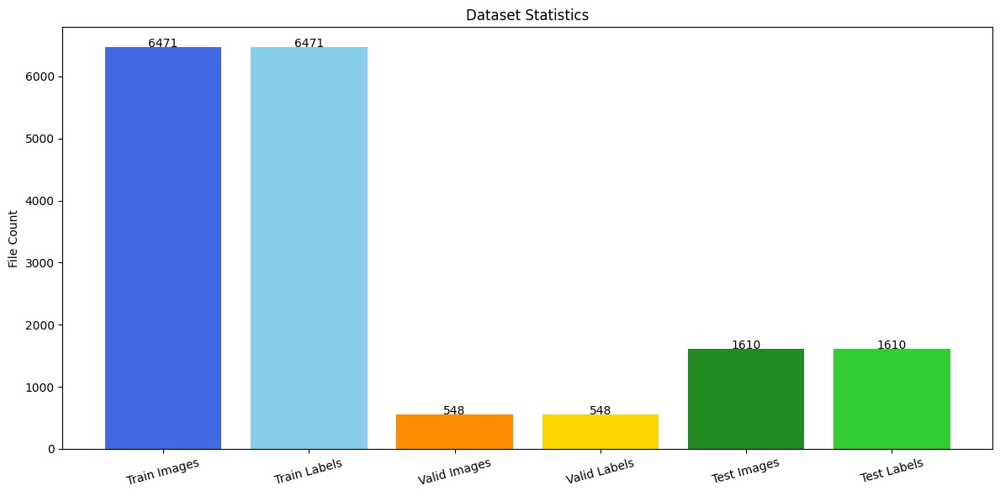

Checking image-label consistency...

Train: OK
Valid: OK
Test: OK


In [91]:
def plot_dataset_stats(dir_paths):
    stats = {
        "Train Images": len(os.listdir(dir_paths["train_img"])),
        "Train Labels": len(os.listdir(dir_paths["train_labels"])),

        "Valid Images": len(os.listdir(dir_paths["val_img"])),
        "Valid Labels": len(os.listdir(dir_paths["val_labels"])),

        "Test Images": len(os.listdir(dir_paths["test_img"])),
        "Test Labels": len(os.listdir(dir_paths["test_labels"]))
    }
    names = list(stats.keys())
    counts = list(stats.values())

    plt.figure(figsize=(12, 6))
    bars = plt.bar(names, counts, color=["royalblue", "skyblue", "darkorange", "gold", "forestgreen", "limegreen"])
    # Add value labels on top
    for bar in bars:
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width() / 2, height + 5, str(height), ha='center')
    plt.title("Dataset Statistics")
    plt.ylabel("File Count")
    plt.xticks(rotation=15)
    plt.tight_layout()
    plt.show()

    # Check mismatch
    print("Checking image-label consistency...\n")
    splits = [
        ("Train", stats["Train Images"], stats["Train Labels"]),
        ("Valid", stats["Valid Images"], stats["Valid Labels"]),
        ("Test", stats["Test Images"], stats["Test Labels"])
    ]
    for split, img_count, label_count in splits:
        if img_count == label_count:
            print(f"{split}: OK")
        else:
            print(f"{split}: Mismatch (Images={img_count}, Labels={label_count})")

plot_dataset_stats(dir_paths)

In [56]:
def plot_dataset_images(img_path, label_path, num_images=8):
    image_files = random.sample(list(img_path.iterdir()), num_images)

    fig, axes = plt.subplots(2, num_images, figsize=(5 * num_images, 12))

    for i, img_file in enumerate(image_files):
        # ---------------- RAW IMAGE ----------------
        image = cv2.imread(str(img_file))
        raw_img = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        axes[0, i].imshow(raw_img)
        axes[0, i].set_title("Raw")
        axes[0, i].axis("off")

        # ---------------- IMAGE WITH LABEL ----------------
        boxed_img = image.copy()
        h_img, w_img = boxed_img.shape[:2]

        label_file = label_path / f"{img_file.stem}.txt"
        if label_file.exists():
            with open(label_file, "r") as f:
                lines = f.readlines()
            
            for line in lines:
                class_id, x_center, y_center, w, h = map(
                    float,
                    line.strip().split()
                )
                # Convert YOLO -> pixel
                x_center *= w_img
                y_center *= h_img
                w *= w_img
                h *= h_img
                x1 = int(x_center - w / 2)
                y1 = int(y_center - h / 2)
                x2 = int(x_center + w / 2)
                y2 = int(y_center + h / 2)

                cv2.rectangle(boxed_img, (x1, y1), (x2, y2), (0, 255, 0), 2)
                cv2.putText(boxed_img, str(int(class_id)), (x1, y1 - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

        boxed_img = cv2.cvtColor(boxed_img, cv2.COLOR_BGR2RGB)
        axes[1, i].imshow(boxed_img)
        axes[1, i].set_title("With Labels")
        axes[1, i].axis("off")

    plt.tight_layout()
    plt.show()

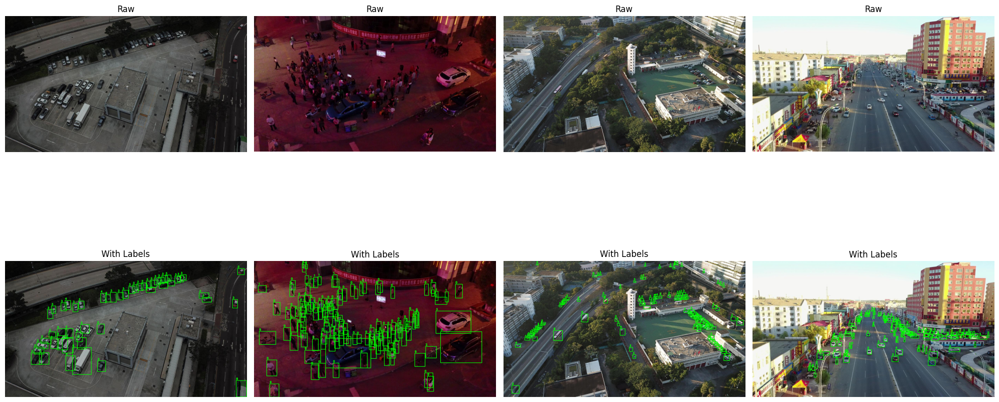

In [57]:
plot_dataset_images(
    dir_paths['train_img'],
    dir_paths['train_labels'],
    num_images=4
)

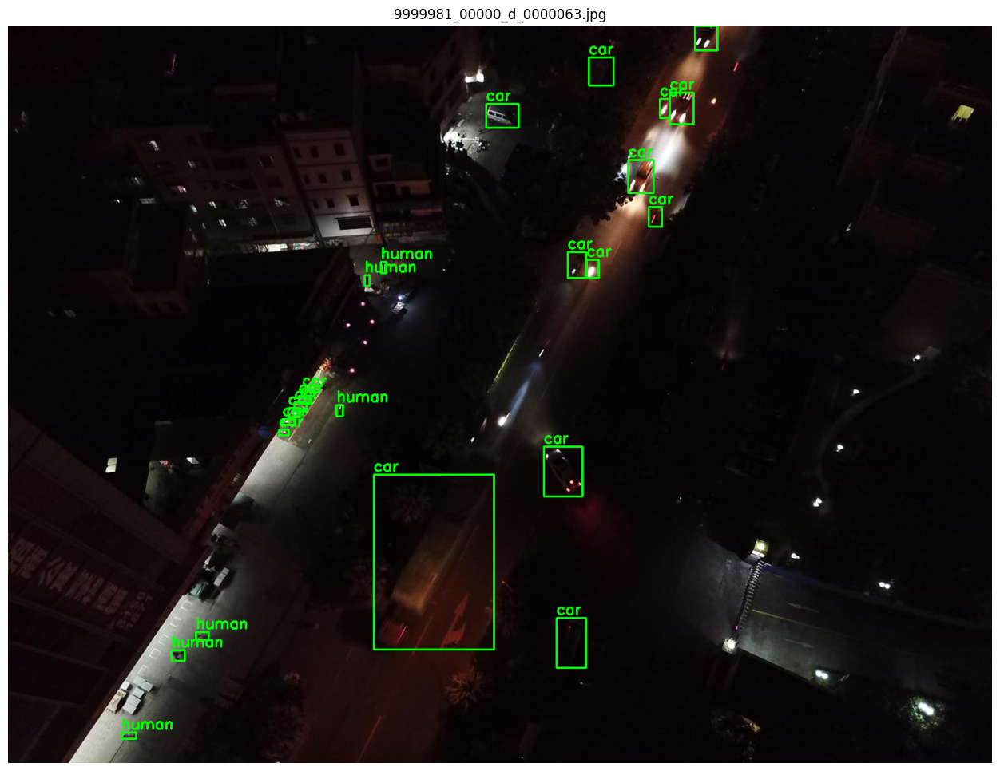

In [13]:
def plot_random_image(img_path, label_path, class_names):
    img_file = random.choice(list(img_path.iterdir()))

    image = cv2.imread(str(img_file))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    boxed_img = image.copy()
    h_img, w_img = boxed_img.shape[:2]

    # Corresponding label file
    label_file = label_path / f"{img_file.stem}.txt"

    if label_file.exists():
        with open(label_file, "r") as f:
            lines = f.readlines()
        for line in lines:
            class_id, x_center, y_center, w, h = map(float, line.strip().split())

            # YOLO -> pixel coordinates
            x_center *= w_img
            y_center *= h_img
            w *= w_img
            h *= h_img

            x1 = int(x_center - w / 2)
            y1 = int(y_center - h / 2)
            x2 = int(x_center + w / 2)
            y2 = int(y_center + h / 2)
            class_name = class_names[int(class_id)]
            # Draw bounding box
            cv2.rectangle(boxed_img, (x1, y1), (x2, y2), (0, 255, 0), 2)
            # Put class name
            cv2.putText(boxed_img, class_name, (x1, y1 - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 255, 0), 2)

    plt.figure(figsize=(26, 12))
    plt.imshow(boxed_img)
    plt.title(img_file.name)
    plt.axis("off")
    plt.show()
plot_random_image(dir_paths['train_img'], dir_paths['train_labels'], new_classes)

In [69]:
classes

{0: 'pedestrian',
 1: 'people',
 2: 'bicycle',
 3: 'car',
 4: 'van',
 5: 'truck',
 6: 'tricycle',
 7: 'awning-tricycle',
 8: 'bus',
 9: 'motor'}

In [12]:
# Convert 10 classes -> 2 classes
# 0 = human
# 1 = car

class_mapping = {
    0: 0,  # pedestrian -> human
    1: 0,  # people -> human

    2: 1,  # bicycle -> car
    3: 1,  # car -> car
    4: 1,  # van -> car
    5: 1,  # truck -> car
    6: 1,  # tricycle -> car
    7: 1,  # awning-tricycle -> car
    8: 1,  # bus -> car
    9: 1   # motor -> car
}

new_classes = {
    0: "human",
    1: "car"
}

In [79]:
def update_labels(label_path, class_mapping):
    label_dir =  Path(label_path)

    # get all text files in the label directory
    txt_files = list(label_dir.glob("*.txt"))
    for txt in tqdm(txt_files, desc="Updating labels"):
        updated_lines = []
        with open(txt, "r") as f:
            lines = f.readlines()
        for line in lines:
            parts = line.strip().split()

            if len(parts) == 0:
                continue
                
            old_class_id = int(parts[0])   # original class id
            new_class_id = class_mapping[old_class_id]  # mapped class id
            parts[0] = str(new_class_id)  # update class id in the line
            updated_lines.append(" ".join(parts) + "\n")
        
        # overwrite the original file with updated lines
        with open(txt, "w") as f:
            f.writelines(updated_lines)
    
    print(f"Updated {len(txt_files)} labels in {label_path}")

In [80]:
update_labels(dir_paths['train_labels'], class_mapping)
update_labels(dir_paths['val_labels'], class_mapping)
update_labels(dir_paths['test_labels'], class_mapping)

Updating labels: 100%|██████████| 6471/6471 [00:46<00:00, 139.02it/s]


Updated 6471 labels in dataset\VisDrone_Dataset\VisDrone2019-DET-train\labels


Updating labels: 100%|██████████| 548/548 [00:04<00:00, 116.88it/s]


Updated 548 labels in dataset\VisDrone_Dataset\VisDrone2019-DET-val\labels


Updating labels: 100%|██████████| 1610/1610 [00:15<00:00, 101.75it/s]

Updated 1610 labels in dataset\VisDrone_Dataset\VisDrone2019-DET-test-dev\labels


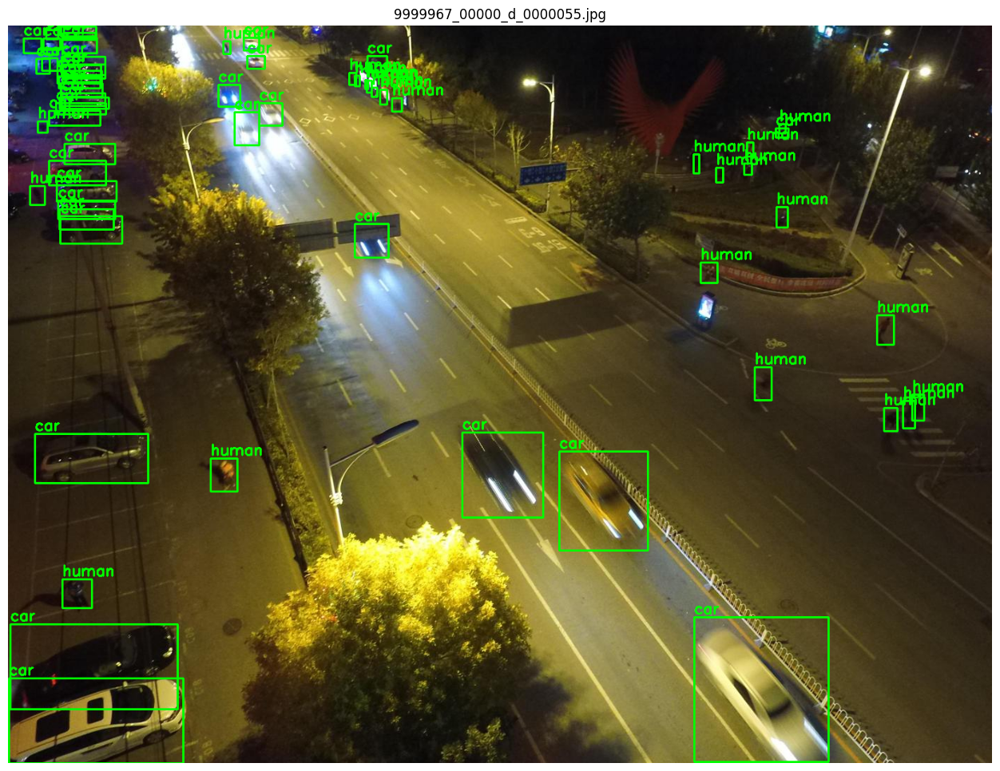

In [85]:
plot_random_image(dir_paths['train_img'], dir_paths['train_labels'], new_classes)

### Resolution stats

In [96]:
widths, heights = [], []

for img in os.listdir(dir_paths['train_img']):
    img_path = os.path.join(dir_paths['train_img'], img)
    img = Image.open(img_path)
    w, h = img.size
    widths.append(w)
    heights.append(h)

print(f"Total images: {len(widths)}")

print("Width stats:")
print("Min:", min(widths))
print("Max:", max(widths))
print("Avg:", sum(widths)/len(widths))

print("\nHeight stats:")
print("Min:", min(heights))
print("Max:", max(heights))
print("Avg:", sum(heights)/len(heights))

Total images: 6471
Width stats:
Min: 480
Max: 2000
Avg: 1519.8895070313708

Height stats:
Min: 360
Max: 1500
Avg: 1002.3970020089631


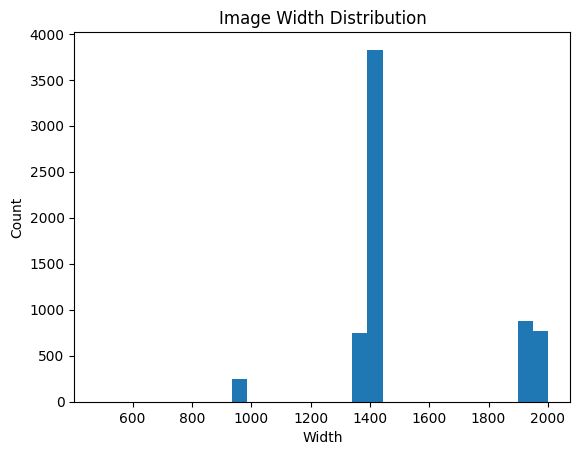

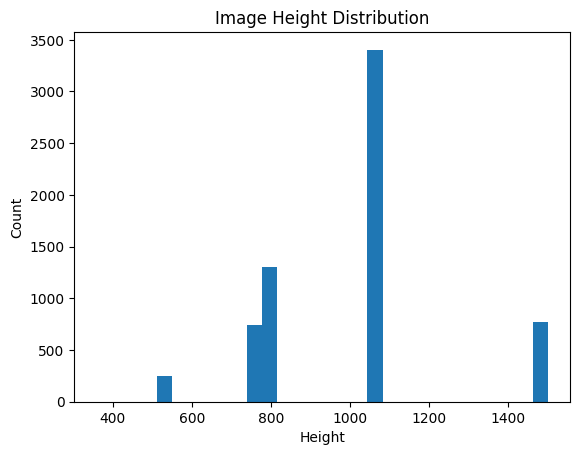

In [97]:
plt.hist(widths, bins=30)
plt.title("Image Width Distribution")
plt.xlabel("Width")
plt.ylabel("Count")
plt.show()

plt.hist(heights, bins=30)
plt.title("Image Height Distribution")
plt.xlabel("Height")
plt.ylabel("Count")
plt.show()

### Box stats

Total boxes: 343176
Avg bbox area: 0.0015347665715870547
Min area: 0.0
Max area: 0.302962110496


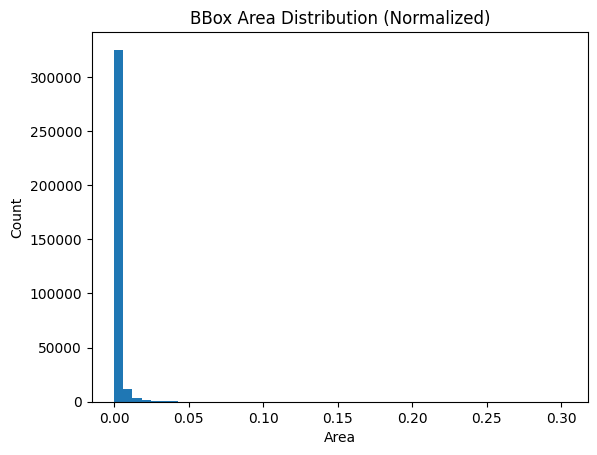

In [101]:
label_dir = dir_paths['train_labels']

bbox_areas = []
bbox_widths = []
bbox_heights = []
aspect_ratios = []

for file in os.listdir(label_dir):
    file_path = os.path.join(label_dir, file)

    with open(file_path, "r") as f:
        lines = f.readlines()

    for line in lines:
        parts = line.strip().split()
        if len(parts) != 5:
            continue

        _, xc, yc, w, h = map(float, parts)

        bbox_widths.append(w)
        bbox_heights.append(h)

        area = w * h
        bbox_areas.append(area)

        if h > 0:
            aspect_ratios.append(w / h)

print("Total boxes:", len(bbox_areas))
print("Avg bbox area:", np.mean(bbox_areas))
print("Min area:", np.min(bbox_areas))
print("Max area:", np.max(bbox_areas))

plt.hist(bbox_areas, bins=50)
plt.title("BBox Area Distribution (Normalized)")
plt.xlabel("Area")
plt.ylabel("Count")
plt.show()

### Number of objects per image (density analysis)

In [102]:
objects_per_image = []

for file in os.listdir(label_dir):
    file_path = os.path.join(label_dir, file)

    with open(file_path, "r") as f:
        lines = f.readlines()

    objects_per_image.append(len(lines))

print("Avg objects per image:", np.mean(objects_per_image))
print("Max objects in one image:", np.max(objects_per_image))
print("Min objects in one image:", np.min(objects_per_image))

Avg objects per image: 53.03291608715809
Max objects in one image: 902
Min objects in one image: 0


In [104]:
sparse = sum(1 for x in objects_per_image if x <= 2)
medium = sum(1 for x in objects_per_image if 3 <= x <= 10)
crowded = sum(1 for x in objects_per_image if x > 10)

print("Sparse images:", sparse)
print("Medium density images:", medium)
print("Crowded images:", crowded)

Sparse images: 26
Medium density images: 399
Crowded images: 6046


### Class distribution + overlap ratio

In [105]:
class_counts = defaultdict(int)

for file in os.listdir(label_dir):
    file_path = os.path.join(label_dir, file)

    with open(file_path, "r") as f:
        lines = f.readlines()

    for line in lines:
        cls = int(line.strip().split()[0])
        class_counts[cls] += 1

print("Class distribution:")
for k, v in sorted(class_counts.items()):
    print(f"Class {k}: {v}")

Class distribution:
Class 0: 187286
Class 1: 155890


In [106]:
from itertools import combinations

co_occurrence = defaultdict(int)

for file in os.listdir(label_dir):
    file_path = os.path.join(label_dir, file)

    with open(file_path, "r") as f:
        classes = [int(line.split()[0]) for line in f.readlines()]

    unique_classes = list(set(classes))

    for c1, c2 in combinations(unique_classes, 2):
        pair = tuple(sorted((c1, c2)))
        co_occurrence[pair] += 1

print("Top co-occurring pairs:")
print(sorted(co_occurrence.items(), key=lambda x: x[1], reverse=True)[:10])

Top co-occurring pairs:
[((0, 1), 3764)]


In [120]:
# validation set class distribution
class_counts = defaultdict(int)

for file in os.listdir(dir_paths['val_labels']):
    file_path = os.path.join(dir_paths['val_labels'], file)

    with open(file_path, "r") as f:
        lines = f.readlines()

    for line in lines:
        cls = int(line.strip().split()[0])
        class_counts[cls] += 1

print("Class distribution:")
for k, v in sorted(class_counts.items()):
    print(f"Class {k}: {v}")

Class distribution:
Class 0: 13969
Class 1: 24790


### YOLO Anchor Box Analysis

In [108]:
img_w, img_h = 1520, 1000

boxes = []

for file in os.listdir(label_dir):
    file_path = os.path.join(label_dir, file)

    with open(file_path, "r") as f:
        lines = f.readlines()

    for line in lines:
        _, xc, yc, w, h = map(float, line.split())

        boxes.append([w * img_w, h * img_h])

In [111]:
from sklearn.cluster import KMeans

boxes = np.array(boxes)

k = 9  # YOLO usually uses 9 anchors
kmeans = KMeans(n_clusters=k, random_state=0, n_init=10).fit(boxes)

anchors = kmeans.cluster_centers_

print("Suggested anchor boxes:")
for a in anchors:
    print(a)

Suggested anchor boxes:
[22.3350384 36.4676276]
[91.90029439 51.84439509]
[141.37538218 196.23496425]
[288.52460985 162.81575647]
[43.03684152 67.71151881]
[48.16539923 28.20881223]
[13.59031848 15.59601387]
[ 78.15547877 113.33755261]
[160.19804223  88.52195605]


In [112]:
img_dir = dir_paths['train_img']
label_dir = dir_paths['train_labels']

empty_images = []
total_images = 0

for img_file in os.listdir(img_dir):
    # get corresponding label file name
    label_file = os.path.splitext(img_file)[0] + ".txt"
    label_path = os.path.join(label_dir, label_file)

    total_images += 1

    # Case 1: label file does not exist OR empty file
    if (not os.path.exists(label_path)) or (os.path.getsize(label_path) == 0):
        empty_images.append(img_file)

print("Total images:", total_images)
print("Images with 0 annotations:", len(empty_images))
print("Empty annotation ratio:", len(empty_images) / total_images)

# Optional: print some examples
print("\nSample empty images:")
print(empty_images[:10])

Total images: 6471
Images with 0 annotations: 1
Empty annotation ratio: 0.00015453562046051616

Sample empty images:
['9999942_00000_d_0000264.jpg']


In [117]:
img_path = os.path.join(dir_paths['train_img'], "9999942_00000_d_0000264.jpg")
label_path = os.path.join(dir_paths['train_labels'], "9999942_00000_d_0000264.txt")

if os.path.exists(img_path):
    os.remove(img_path)

if os.path.exists(label_path):
    os.remove(label_path)

*****
# Validation & Saving

In [119]:
img_dir = dir_paths['train_img']
label_dir = dir_paths['train_labels']

missing_labels = []
missing_images = []

for img in os.listdir(img_dir):
    label = os.path.splitext(img)[0] + ".txt"
    if not os.path.exists(os.path.join(label_dir, label)):
        missing_labels.append(img)

for label in os.listdir(label_dir):
    img = os.path.splitext(label)[0] + ".jpg"
    if not os.path.exists(os.path.join(img_dir, img)):
        missing_images.append(label)

print("Missing labels:", len(missing_labels))
print("Missing images:", len(missing_images))

Missing labels: 0
Missing images: 0


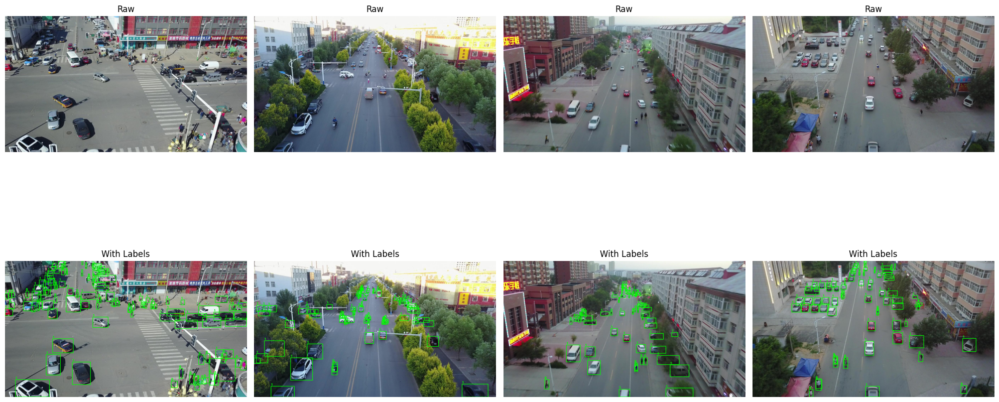

In [124]:
plot_dataset_images(
    dir_paths['val_img'],
    dir_paths['val_labels'],
    num_images=4
)

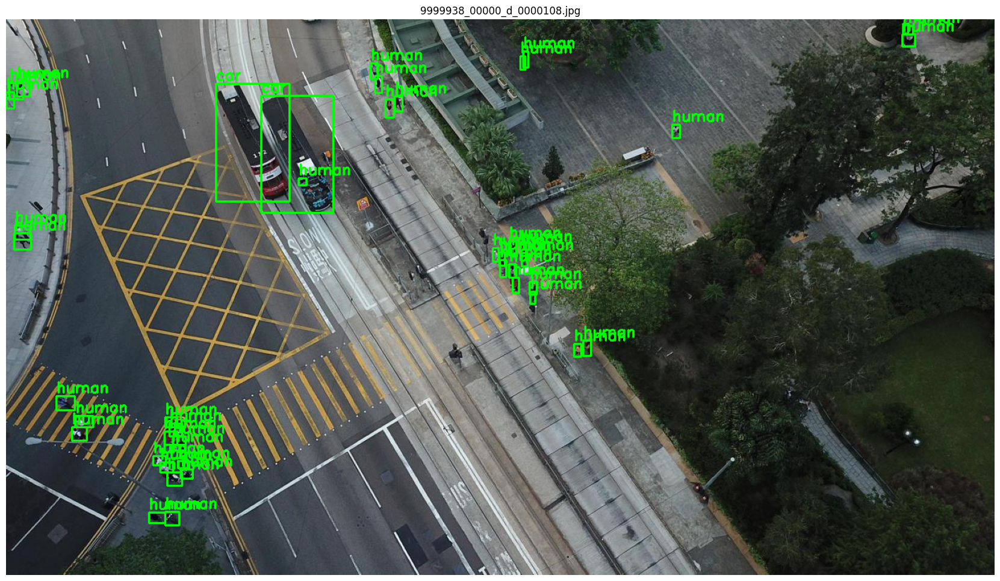

In [128]:
plot_random_image(dir_paths['test_img'], dir_paths['test_labels'], new_classes)

In [ ]:
data = {
    "path": ".dataset/VisDrone_Dataset",

    "train": "VisDrone2019-DET-train/images",
    "val": "VisDrone2019-DET-val/images",
    "test": "VisDrone2019-DET-test-dev/images",
    
    "nc": 2,
    
    "names": {
        0: "human",
        1: "car"
    }
}

output_file = Path("configs/ds_config.yaml")

os.makedirs(output_file.parent, exist_ok=True)
with open(output_file, "w", encoding="utf-8") as f:
    yaml.dump(data, f, sort_keys=False)

print(f"YAML file saved at: {output_file.resolve()}")

YAML file saved at: D:\Programing\drone-human-detection-and-counting-system\configs\ds_config.yaml


*****
# Convert Labels HBB to OBB format for YOLO26M-OBB

In [16]:
# ── HBB → OBB conversion (single label file, returns list of OBB lines) ──────
def convert_hbb_to_obb_lines(label_file: Path) -> list[str]:
    """
    Reads a YOLO HBB label file and returns converted OBB lines.
    Input  line: class cx cy w h
    Output line: class x1 y1 x2 y2 x3 y3 x4 y4
    """
    obb_lines = []
    for line in label_file.read_text().splitlines():
        parts = line.strip().split()
        if len(parts) != 5:
            continue  # skip malformed lines
        cls, cx, cy, w, h = parts
        cx, cy, w, h = float(cx), float(cy), float(w), float(h)

        x1, y1 = cx - w / 2, cy - h / 2   # top-left
        x2, y2 = cx + w / 2, cy - h / 2   # top-right
        x3, y3 = cx + w / 2, cy + h / 2   # bottom-right
        x4, y4 = cx - w / 2, cy + h / 2   # bottom-left

        obb_lines.append(
            f"{cls} {x1:.6f} {y1:.6f} {x2:.6f} {y2:.6f} {x3:.6f} {y3:.6f} {x4:.6f} {y4:.6f}")
    return obb_lines

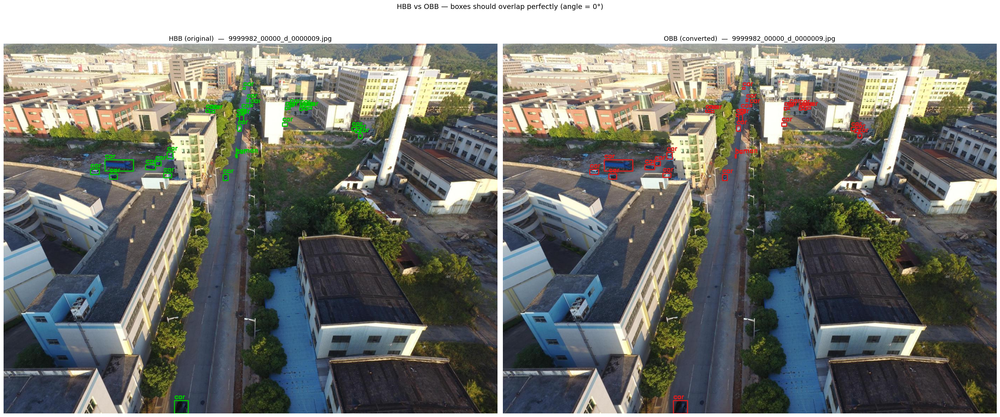


Image : 9999982_00000_d_0000009.jpg  (1400×1050 px)
Labels: 33 boxes

────────────────────────────── BEFORE (HBB) ──────────────────────────────
  1 0.360000 0.982857 0.028571 0.034286
  1 0.185000 0.347143 0.017143 0.014286
  1 0.222143 0.360000 0.015714 0.015238

────────────────────────────── AFTER  (OBB) ──────────────────────────────
  1 0.345714 0.965714 0.374285 0.965714 0.374285 1.000000 0.345714 1.000000
  1 0.176428 0.340000 0.193572 0.340000 0.193572 0.354286 0.176428 0.354286
  1 0.214286 0.352381 0.230000 0.352381 0.230000 0.367619 0.214286 0.367619
  ... (30 more boxes not shown)


In [19]:
# ── HBB (left) vs OBB (right) side by side ─────────────────
def plot_hbb_vs_obb(img_path: Path, label_path: Path, class_names: dict):
    """
    Randomly picks one image, converts its HBB labels to OBB on-the-fly,
    then plots both side by side for visual verification.

    Left panel  — HBB: axis-aligned rectangles drawn with cv2.rectangle (green)
    Right panel — OBB: rotated polygons drawn with cv2.polylines (red) (at angle=0 these should overlap perfectly with the HBB boxes)
    """
    img_file   = random.choice(list(img_path.iterdir()))
    label_file = label_path / f"{img_file.stem}.txt"

    image  = cv2.imread(str(img_file))
    image  = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    H, W   = image.shape[:2]

    hbb_img = image.copy()
    obb_img = image.copy()

    # ── LEFT: draw original HBB boxes (green rectangles) ─────────────────────
    hbb_lines = label_file.read_text().splitlines()
    for line in hbb_lines:
        parts = line.strip().split()
        if len(parts) != 5:
            continue
        cls_id, cx, cy, w, h = parts
        cx, cy, w, h = float(cx) * W, float(cy) * H, float(w) * W, float(h) * H

        x1 = int(cx - w / 2);  y1 = int(cy - h / 2)
        x2 = int(cx + w / 2);  y2 = int(cy + h / 2)

        cv2.rectangle(hbb_img, (x1, y1), (x2, y2), (0, 200, 0), 2)
        cv2.putText(hbb_img, class_names[int(cls_id)], (x1, max(y1 - 5, 0)), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 200, 0), 2)

    # ── RIGHT: convert to OBB then draw rotated polygons (red) ───────────────
    obb_lines = convert_hbb_to_obb_lines(label_file)
    for line in obb_lines:
        parts = line.strip().split()
        if len(parts) != 9:
            continue
        cls_id  = int(parts[0])
        coords  = list(map(float, parts[1:]))   # [x1,y1, x2,y2, x3,y3, x4,y4]

        # Scale normalised coords → pixel coords
        pts = np.array([
            [coords[0] * W, coords[1] * H],   # top-left
            [coords[2] * W, coords[3] * H],   # top-right
            [coords[4] * W, coords[5] * H],   # bottom-right
            [coords[6] * W, coords[7] * H],   # bottom-left
        ], dtype=np.int32)

        cv2.polylines(obb_img, [pts], isClosed=True, color=(220, 30, 30), thickness=2)
        cv2.putText(obb_img, class_names[cls_id], (pts[0][0], max(pts[0][1] - 5, 0)), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (220, 30, 30), 2)

    # ── Plot side by side ─────────────────────────────────────────────────────
    fig, axes = plt.subplots(1, 2, figsize=(28, 12))

    axes[0].imshow(hbb_img)
    axes[0].set_title(f"HBB (original)  —  {img_file.name}", fontsize=13)
    axes[0].axis("off")

    axes[1].imshow(obb_img)
    axes[1].set_title(f"OBB (converted)  —  {img_file.name}", fontsize=13)
    axes[1].axis("off")

    plt.suptitle("HBB vs OBB — boxes should overlap perfectly (angle = 0°)", fontsize=14, y=1.01)
    plt.tight_layout()
    plt.show()

    # ── Print a sample of the label conversion for reference ──────────────────
    print(f"\nImage : {img_file.name}  ({W}×{H} px)")
    print(f"Labels: {len(hbb_lines)} boxes\n")
    print(f"{'─'*30} BEFORE (HBB) {'─'*30}")
    for l in hbb_lines[:3]:
        print(" ", l)
    print(f"\n{'─'*30} AFTER  (OBB) {'─'*30}")
    for l in obb_lines[:3]:
        print(" ", l)
    if len(hbb_lines) > 3:
        print(f"  ... ({len(hbb_lines) - 3} more boxes not shown)")

plot_hbb_vs_obb(dir_paths['train_img'], dir_paths['train_labels'], new_classes)

In [20]:
def hbb_to_obb(label_dir: str):
    label_dir = Path(label_dir)
    for txt in label_dir.glob("*.txt"):
        obb_lines = convert_hbb_to_obb_lines(txt)
        txt.write_text("\n".join(obb_lines))
    print(f"Converted: {label_dir}")

hbb_to_obb("dataset/VisDrone_Dataset/VisDrone2019-DET-train/labels")
hbb_to_obb("dataset/VisDrone_Dataset/VisDrone2019-DET-val/labels")
hbb_to_obb("dataset/VisDrone_Dataset/VisDrone2019-DET-test-dev/labels")

Converted: dataset\VisDrone_Dataset\VisDrone2019-DET-train\labels
Converted: dataset\VisDrone_Dataset\VisDrone2019-DET-val\labels
Converted: dataset\VisDrone_Dataset\VisDrone2019-DET-test-dev\labels


In [26]:
def plot_dataset_images_obb(img_path, label_path, class_names, num_images=4):
    image_files = random.sample(list(img_path.iterdir()), num_images)

    fig, axes = plt.subplots(2, num_images, figsize=(5 * num_images, 12))

    for i, img_file in enumerate(image_files):
        # ---------------- RAW IMAGE ----------------
        image = cv2.imread(str(img_file))
        raw_img = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        axes[0, i].imshow(raw_img)
        axes[0, i].set_title("Raw")
        axes[0, i].axis("off")

        # ---------------- IMAGE WITH OBB LABEL ----------------
        boxed_img = image.copy()
        h_img, w_img = boxed_img.shape[:2]

        label_file = label_path / f"{img_file.stem}.txt"
        if label_file.exists():
            with open(label_file, "r") as f:
                lines = f.readlines()

            for line in lines:
                parts = line.strip().split()
                if len(parts) != 9:          # class + 8 coords
                    continue

                cls_id = int(float(parts[0]))
                coords = list(map(float, parts[1:]))   # [x1,y1,x2,y2,x3,y3,x4,y4]

                # Scale normalised coords → pixel coords and reshape to (4,2)
                pts = np.array([
                    [coords[0] * w_img, coords[1] * h_img],  # top-left
                    [coords[2] * w_img, coords[3] * h_img],  # top-right
                    [coords[4] * w_img, coords[5] * h_img],  # bottom-right
                    [coords[6] * w_img, coords[7] * h_img],  # bottom-left
                ], dtype=np.int32)

                # Draw rotated polygon and class label
                cv2.polylines(boxed_img, [pts], isClosed=True, color=(0, 255, 0), thickness=2)
                cv2.putText(
                    boxed_img, class_names[cls_id],
                    (pts[0][0], max(pts[0][1] - 5, 0)),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2
                )

        boxed_img = cv2.cvtColor(boxed_img, cv2.COLOR_BGR2RGB)
        axes[1, i].imshow(boxed_img)
        axes[1, i].set_title("With OBB Labels")
        axes[1, i].axis("off")

    plt.tight_layout()
    plt.show()

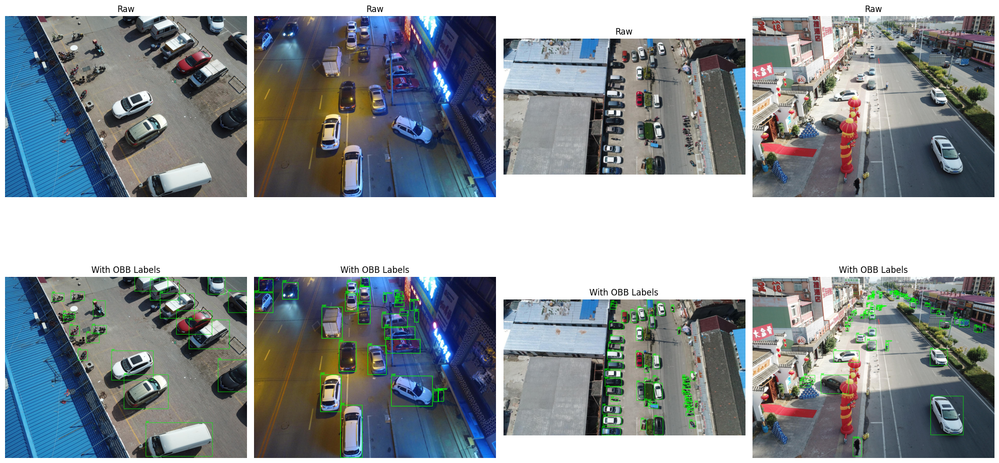

In [27]:
plot_dataset_images_obb(dir_paths['train_img'], dir_paths['train_labels'], new_classes)